<a href="https://colab.research.google.com/github/17sushmita/Object-Detection-on-X-ray-Images/blob/master/Object_Detection_on_X_ray_Images.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [0]:
#!pip install tensorflow-gpu==1.14
import tensorflow
print(tensorflow.__version__)
import tensorflow.contrib

1.15.2


In [0]:
import tensorflow.contrib

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
%cd '/content/drive/My Drive/desktop/scripts/preprocessing'
!python xml_to_csv.py -i '/content/drive/My Drive/desktop/workspace/training_demo/images/train' -o '/content/drive/My Drive/desktop/workspace/training_demo/annotations/train_labels.csv'
!python xml_to_csv.py -i '/content/drive/My Drive/desktop/workspace/training_demo/images/train' -o '/content/drive/My Drive/desktop/workspace/training_demo/annotations/train_labels.csv'

/content/drive/My Drive/desktop/scripts/preprocessing
Successfully converted xml to csv.
Successfully converted xml to csv.


In [0]:
%cd '/content/drive/My Drive/desktop/models/research/slim'
!python setup.py build
!python setup.py install

/content/drive/My Drive/desktop/models/research/slim
running build
running build_py
running egg_info
writing slim.egg-info/PKG-INFO
writing dependency_links to slim.egg-info/dependency_links.txt
writing top-level names to slim.egg-info/top_level.txt
writing manifest file 'slim.egg-info/SOURCES.txt'
running install
running bdist_egg
running egg_info
writing slim.egg-info/PKG-INFO
writing dependency_links to slim.egg-info/dependency_links.txt
writing top-level names to slim.egg-info/top_level.txt
writing manifest file 'slim.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_py
creating build/bdist.linux-x86_64/egg
creating build/bdist.linux-x86_64/egg/datasets
copying build/lib/datasets/build_imagenet_data.py -> build/bdist.linux-x86_64/egg/datasets
copying build/lib/datasets/dataset_factory.py -> build/bdist.linux-x86_64/egg/datasets
copying build/lib/datasets/download_and_convert_imagenet.sh -> build/bdist.linux-x86_64/egg/da

In [0]:
import os
os.environ['PYTHONPATH'] += ':/content/gdrive/My Drive/Desktop/models/research/:/content/gdrive/My Drive/Desktop/models/research/slim'

In [0]:
%cd '/content/drive/My Drive/desktop/scripts/preprocessing'
!python generate_tfrecord.py --label0='blade' --label1='gun' --label2='knife' --label3='shuriken' --csv_input='/content/drive/My Drive/desktop/workspace/training_demo/annotations/train_labels.csv'  --output_path='/content/drive/My Drive/desktop/workspace/training_demo/annotations/train.record' --img_path='/content/drive/My Drive/desktop/workspace/training_demo/images/train'
!python generate_tfrecord.py --label0='blade' --label1='gun' --label2='knife' --label3='shuriken' --csv_input='/content/drive/My Drive/desktop/workspace/training_demo/annotations/test_labels.csv'  --output_path='/content/drive/My Drive/desktop/workspace/training_demo/annotations/test.record'  --img_path='/content/drive/My Drive/desktop/workspace/training_demo/images/test'


/content/drive/My Drive/desktop/scripts/preprocessing
Successfully created the TFRecords: /content/drive/My Drive/desktop/workspace/training_demo/annotations/train.record
Successfully created the TFRecords: /content/drive/My Drive/desktop/workspace/training_demo/annotations/test.record


In [0]:
%cd '/content/drive/My Drive/desktop/workspace/training_demo/training'
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/samples/configs/faster_rcnn_resnet50_coco.config

/content/drive/My Drive/desktop/workspace/training_demo/training
--2020-05-12 13:04:18--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/samples/configs/faster_rcnn_resnet50_coco.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3735 (3.6K) [text/plain]
Saving to: ‘faster_rcnn_resnet50_coco.config’

faster_rcnn_resnet5 100%[===================>]   3.65K  --.-KB/s    in 0.001s  

2020-05-12 13:04:18 (6.67 MB/s) - ‘faster_rcnn_resnet50_coco.config’ saved [3735/3735]



In [0]:
%cd training_demo/pre-trained-model/

/content/drive/My Drive/desktop/workspace/training_demo/pre-trained-model


In [0]:
!wget http://download.tensorflow.org/models/object_detection/faster_rcnn_resnet50_coco_2018_01_28.tar.gz

--2020-05-12 13:02:04--  http://download.tensorflow.org/models/object_detection/faster_rcnn_resnet50_coco_2018_01_28.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 108.177.112.128, 2607:f8b0:4001:c12::80
Connecting to download.tensorflow.org (download.tensorflow.org)|108.177.112.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 381355771 (364M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet50_coco_2018_01_28.tar.gz’

faster_rcnn_resnet5 100%[===================>] 363.69M  72.2MB/s    in 5.0s    

2020-05-12 13:02:09 (73.0 MB/s) - ‘faster_rcnn_resnet50_coco_2018_01_28.tar.gz’ saved [381355771/381355771]



In [0]:
!tar -xvf faster_rcnn_resnet50_coco_2018_01_28.tar.gz

faster_rcnn_resnet50_coco_2018_01_28/
faster_rcnn_resnet50_coco_2018_01_28/model.ckpt.index
faster_rcnn_resnet50_coco_2018_01_28/checkpoint
faster_rcnn_resnet50_coco_2018_01_28/pipeline.config
faster_rcnn_resnet50_coco_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_resnet50_coco_2018_01_28/model.ckpt.meta
faster_rcnn_resnet50_coco_2018_01_28/saved_model/
faster_rcnn_resnet50_coco_2018_01_28/saved_model/saved_model.pb
faster_rcnn_resnet50_coco_2018_01_28/saved_model/variables/
faster_rcnn_resnet50_coco_2018_01_28/frozen_inference_graph.pb


In [0]:
%cd /content/drive/My Drive/desktop/workspace/training_demo
%load_ext tensorboard
%tensorboard --logdir training/

/content/drive/My Drive/desktop/workspace/training_demo


<IPython.core.display.Javascript object>

In [0]:
import os
os.getcwd()
%cd '/content/drive/My Drive/desktop/workspace/training_demo'

/content/drive/My Drive/desktop/workspace/training_demo


In [0]:
import os
os.environ['PYTHONPATH'] += ':/content/drive/My Drive/desktop/models/research/:/content/drive/My Drive/desktop/models/research/slim'

In [0]:
os.environ['PYTHONPATH']

'/env/python:/content/drive/My Drive/desktop/models/research/:/content/drive/My Drive/desktop/models/research/slim:/content/drive/My Drive/desktop/models/research/:/content/drive/My Drive/desktop/models/research/slim:/content/drive/My Drive/desktop/models/research/:/content/drive/My Drive/desktop/models/research/slim'

In [0]:
!python model_main.py --alsologtostderr --model_dir=training/ --pipeline_config_path=training/faster_rcnn_resnet50_coco.config


The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



W0513 16:09:05.610513 140330319538048 module_wrapper.py:139] From /content/drive/My Drive/desktop/models/research/object_detection/utils/config_util.py:102: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.


W0513 16:09:07.017139 140330319538048 module_wrapper.py:139] From /content/drive/My Drive/desktop/models/research/object_detection/model_lib.py:628: The name tf.logging.warning is deprecated. Please use tf.compat.v1.logging.warning instead.

W0513 16:09:07.017390 140330319538048 model_lib.py:629] Forced number of epochs for all eval validations to be 1.

W0513 16:09:07.017545 140330319538048 mod

In [0]:
!pip install git+https://github.com/philferriere/cocoapi.git#subdirectory=PythonAPI


  Cloning https://github.com/philferriere/cocoapi.git to /tmp/pip-req-build-9xf77ems
  Running command git clone -q https://github.com/philferriere/cocoapi.git /tmp/pip-req-build-9xf77ems
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-linux_x86_64.whl size=275344 sha256=b70c5b2f078c74854e8d9dc25e62d0fe8033dd24d0e82ced84b35d12ef82de1d
  Stored in directory: /tmp/pip-ephem-wheel-cache-pvy9a0hc/wheels/69/2b/12/2fa959e49f73d26cff202c2f4e5079096c9c57c8a8509fd75c
Successfully built pycocotools


In [0]:
%tensorboard --logdir=training\

UsageError: Line magic function `%tensorboard` not found.


In [0]:

%tensorflow_version 2.x
!pip uninstall -y tensorflow
!pip install tensorflow-gpu==1.14.0


TensorFlow is already loaded. Please restart the runtime to change versions.
Uninstalling tensorflow-2.2.0:
  Successfully uninstalled tensorflow-2.2.0


In [0]:
!python export_inference_graph.py --input_type image_tensor --pipeline_config_path training/faster_rcnn_resnet50_coco.config --trained_checkpoint_prefix training/model.ckpt-9783 --output_directory trained_inference_graph_v3



The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.


W0513 16:26:13.822244 139957179824000 module_wrapper.py:139] From export_inference_graph.py:145: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.


W0513 16:26:13.829104 139957179824000 module_wrapper.py:139] From /content/drive/My Drive/desktop/models/research/object_detection/exporter.py:402: The name tf.gfile.MakeDirs is deprecated. Please use tf.io.gfile.makedirs instead.


W0513 16:26:13.830940 139957179824000 module_wrapper.py:139] From /content/drive/My Drive/desktop/models/research/object_detection/exporter.py:121: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder ins

In [0]:
%cd 
!zip -r X-ray_frcnn_resnet50_exp_graph.zip trained_inference_graph
#!zip -r X-ray_frcnn_resnet50_exp_graph.zip . -i trained_inference_graph

	zip warning: zip file empty


In [0]:
%cd '/content/drive/My Drive/desktop/models/research/object_detection'
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util


/content/drive/My Drive/desktop/models/research/object_detection


ModuleNotFoundError: ignored

(80, 40, 3)


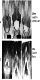

(672, 552, 3)


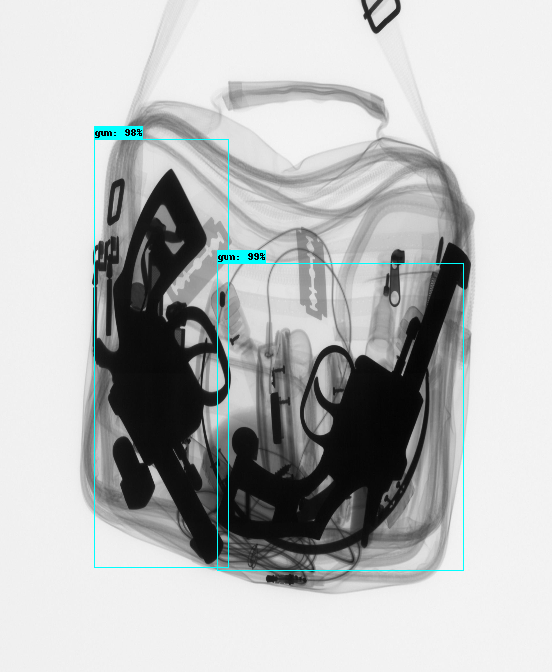

(534, 428, 3)


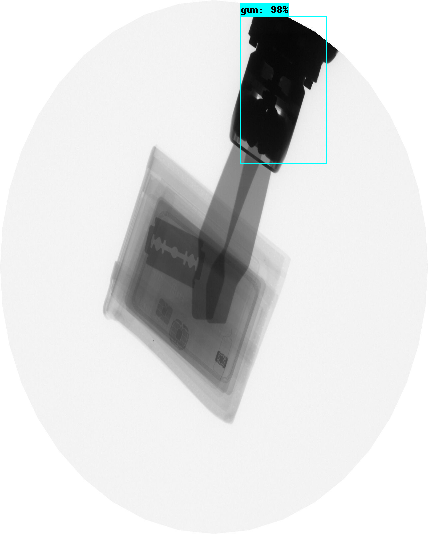

(534, 428, 3)


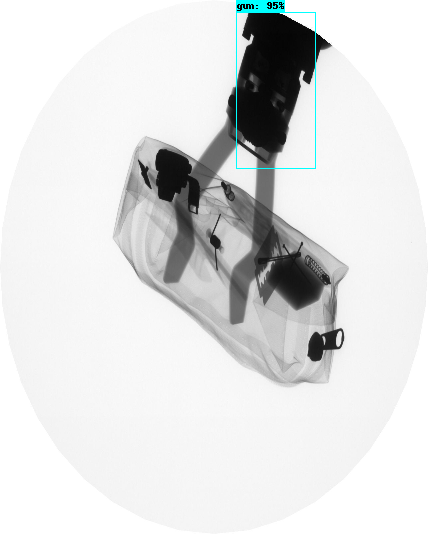

(534, 428, 3)


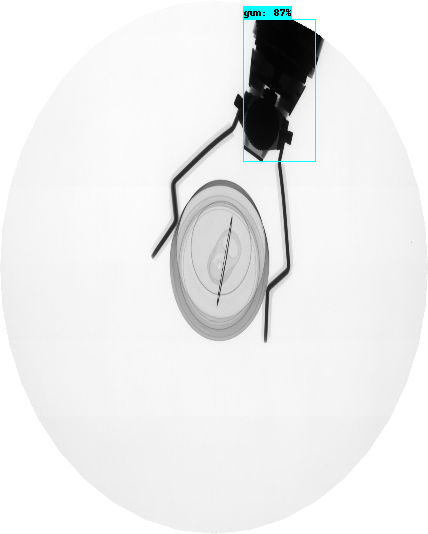

(672, 552, 3)


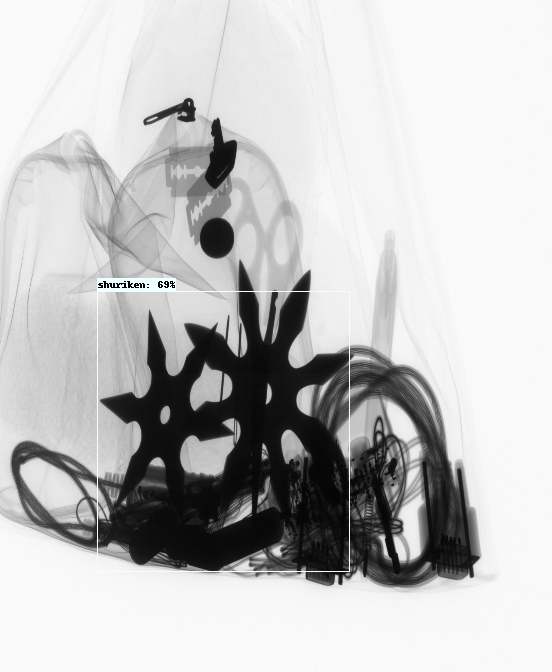

(672, 552, 3)


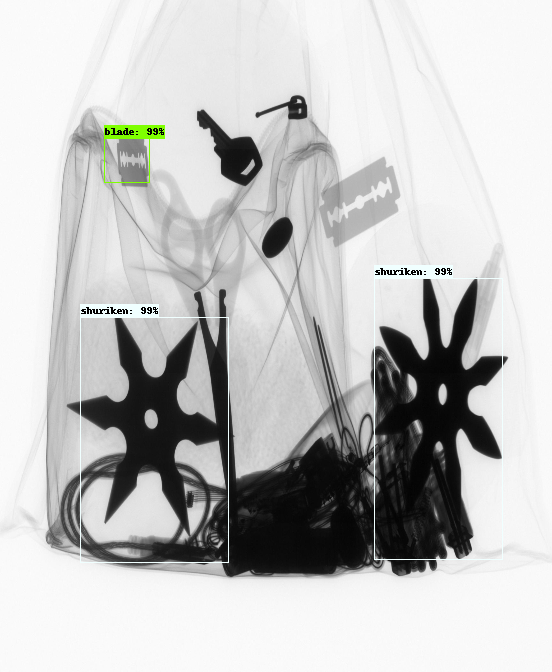

(672, 552, 3)


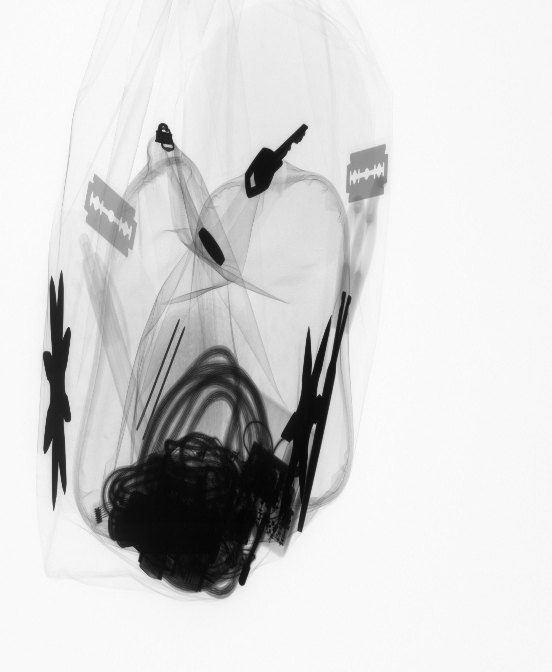

(672, 552, 3)


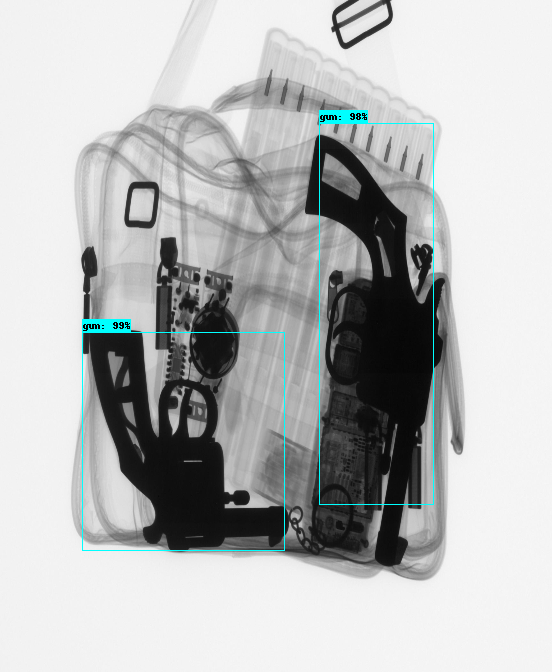

(672, 552, 3)


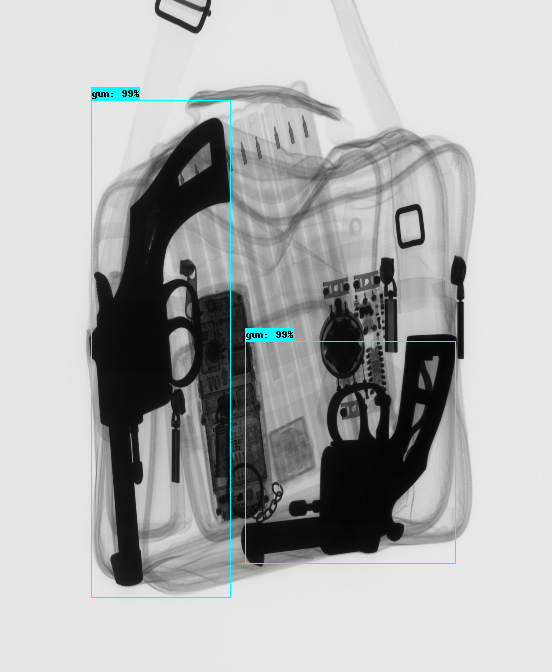

(672, 552, 3)


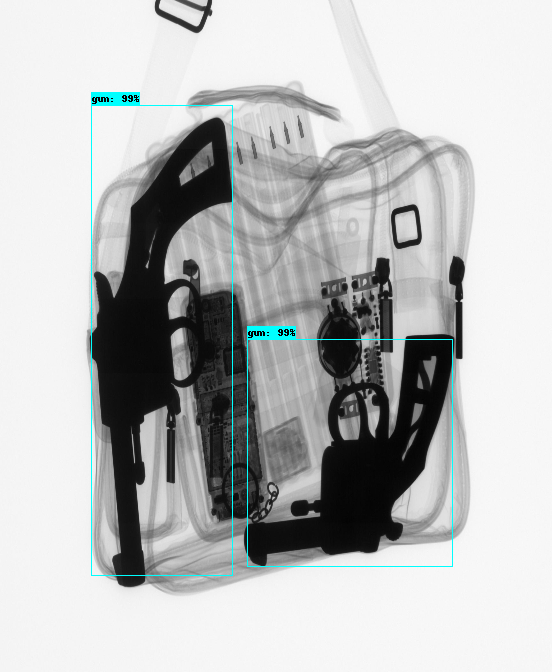

(672, 552, 3)


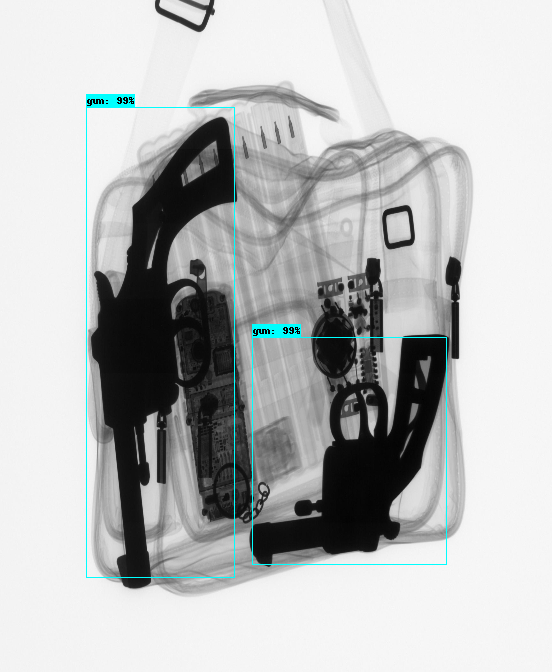

(534, 428, 3)


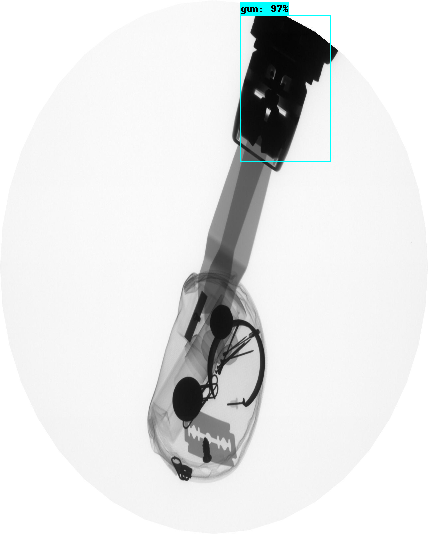

(672, 552, 3)


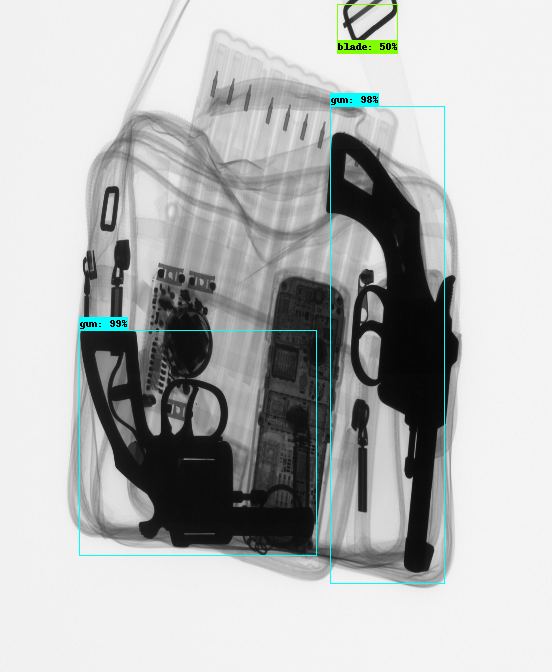

(672, 552, 3)


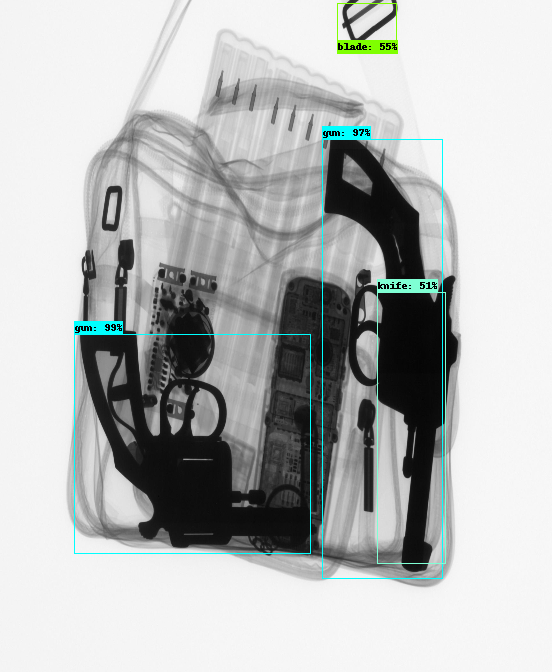

(672, 552, 3)


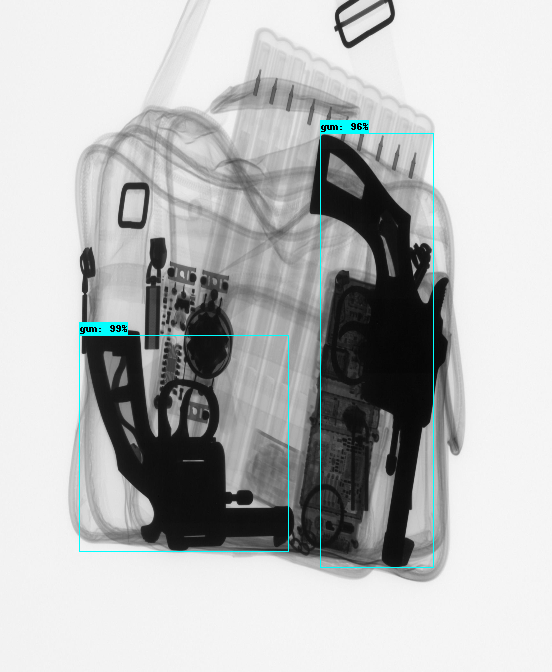

(672, 552, 3)


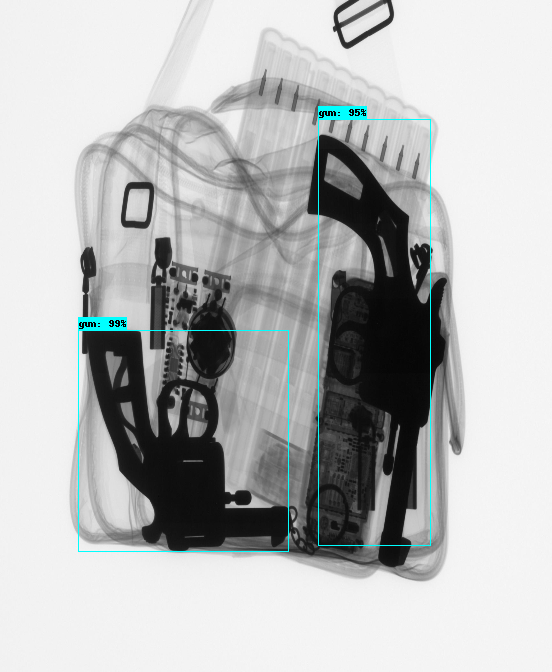

(672, 552, 3)


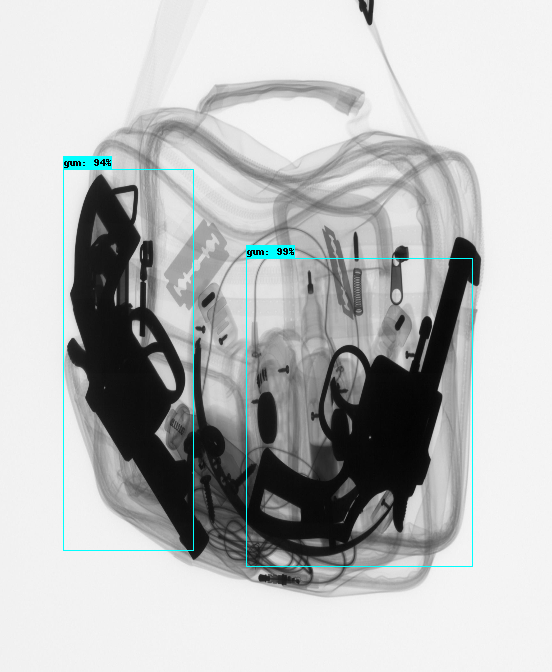

In [0]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import cv2
from distutils.version import StrictVersion
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
import imageio
# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util



### Model preparation variable
MODEL_NAME = '/content/drive/My Drive/desktop/workspace/training_demo/trained_inference_graph_v2'
PATH_TO_FROZEN_GRAPH = MODEL_NAME + '/frozen_inference_graph.pb'
PATH_TO_LABELS = '/content/drive/My Drive/desktop/workspace/training_demo/annotations/label_map.pbtxt'
NUM_CLASSES = 1 #remember number of objects you are training? cool.


### Load a (frozen) Tensorflow model into memory.
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_FROZEN_GRAPH, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')


###Loading label map
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)




### Load image into numpy function
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  print(np.array(image).shape)
  return np.array(image).reshape((im_height, im_width, 3)).astype(np.uint8)




###STATING THE PATH TO IMAGES TO BE TESTED
PATH_TO_TEST_IMAGES_DIR = '/content/drive/My Drive/desktop/workspace/training_demo/test_images/'
TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image{}.png'.format(i)) for i in range(1, 19) ]
IMAGE_SIZE = (12, 8)




### Function to run inference on a single image which will later be used in an iteration
def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[1], image.shape[2])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: image})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.int64)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict



### To iterate on each image in the test image path defined 
### NB define the range of numbers and let it match the number of imAGES IN TEST FOLDER +1
for image_path in TEST_IMAGE_PATHS:
  #image = Image.open(image_path)
  image=cv2.imread(image_path)
  image_np=cv2.resize(image,(int(image.shape[0]*0.25),int(image.shape[1]*0.25)),cv2.INTER_AREA)
  print(image_np.shape)

  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  #image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np_expanded, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=1)
  display(Image.fromarray(image_np))


In [0]:
import cv2
im=cv2.imread('/content/drive/My Drive/desktop/workspace/training_demo/test_images/image10.png')
print(im.shape)
cv2.imshow(im)

(2208, 2688, 3)


DisabledFunctionError: ignored

In [0]:
image = Image.open(image_path)

In [0]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [0]:
%cd '/content/drive/My Drive/desktop/models'
!export PYTHONPATH=$PYTHONPATH:pwd:pwd/slim

/content/drive/My Drive/desktop/models


In [0]:
!pip uninstall tensorflow==2.2.0
!pip install tensorflow==1.15.2

Uninstalling tensorflow-2.2.0:
  Would remove:
    /usr/local/bin/estimator_ckpt_converter
    /usr/local/bin/saved_model_cli
    /usr/local/bin/tensorboard
    /usr/local/bin/tf_upgrade_v2
    /usr/local/bin/tflite_convert
    /usr/local/bin/toco
    /usr/local/bin/toco_from_protos
    /usr/local/lib/python3.6/dist-packages/tensorflow-2.2.0.dist-info/*
    /usr/local/lib/python3.6/dist-packages/tensorflow/*
Proceed (y/n)? y
y
  Successfully uninstalled tensorflow-2.2.0
     |████████████████████████████████| 110.5MB 1.3MB/s 
     |████████████████████████████████| 512kB 54.9MB/s 
     |████████████████████████████████| 3.8MB 56.0MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp36-none-any.whl size=7540 sha256=eb50282f7f2e81015b87f3377ee58a37942c1e33197c49178a0c2a2d34807b2d
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built gast
ERROR: tensorflow-probability 0.10.0rc0 has requirement gast>=0.3.2, but you'll

In [0]:
%cd '/content/drive/My Drive/desktop/workspace/training_demo'
import os
os.getcwd()

/content/drive/My Drive/desktop/workspace/training_demo


'/content/drive/My Drive/desktop/workspace/training_demo'

In [0]:
import pandas as pd
x=pd.read_csv('/content/drive/My Drive/desktop/workspace/training_demo/annotations/train_labels.csv')
x.groupby('class').count()

,filename,width,height,xmin,ymin,xmax,ymax
class,,,,,,,
blade,46,46,46,46,46,46,46
gun,150,150,150,150,150,150,150
knife,18,18,18,18,18,18,18
shuriken,18,18,18,18,18,18,18


In [0]:
%tensorflow_version 1.x
%cd '/content/drive/My Drive/desktop/workspace/training_demo'
!python eval.py --logtostderr --pipeline_config_path=training/faster_rcnn_resnet50_coco.config --checkpoint_dir=training/ --eval_dir=training/eval_0


/content/drive/My Drive/desktop/workspace/training_demo
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.




Instructions for updating:
Use object_detection/model_main.py.
W0513 20:18:39.374435 140127824799616 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/absl/app.py:250: main (from __main__) is deprecated and will be removed in a future version.
Instructions for updating:
Use object_detection/model_main.py.

W0513 20:18:39.374866 140127824799616 module_wrapper.py:139] From eval.py:88: The name tf.gfile.MakeDirs is deprecated. Please use tf.io.gfile.makedirs instead.


W0513 20:18:39.375541 140127824799616 module_wrapper.py:139] From /content/drive/My Drive/de